In [1]:
%matplotlib inline
from Pathopticon_master import *
import pandas as pd
import pickle
from tqdm import tqdm
import numpy as np
import os
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.collections import PatchCollection

# Data prep

In [87]:
proj_path = '/Users/ardahalu/Research/CICS/L1000_project/Pathopticon_all_analyses/'
proj_external_data_path = '/Users/ardahalu/Research/CICS/L1000_project/Pathopticon_all_analyses/Pathopticon_external_data/'
proj_intermediary_outputs_path = '/Users/ardahalu/Research/CICS/L1000_project/Pathopticon_all_analyses/Pathopticon_intermediary_outputs/'
proj_benchmark_path = '/Users/ardahalu/Research/CICS/L1000_project/Pathopticon_all_analyses/Pathopticon_benchmark_outputs/'
proj_output_path = '/Users/ardahalu/Research/CICS/L1000_project/Pathopticon_all_analyses/Pathopticon_all_analyses_outputs/'
input_paths_dict = input_paths(proj_path)

In [3]:
L1000_gene_info, L1000_cell_info, L1000_inst_info, L1000_pert_info, L1000_sig_info = import_L1000_metadata(input_paths_dict['L1000_gene_info_path'], 
                                                                                                           input_paths_dict['L1000_cell_info_path'],
                                                                                                           input_paths_dict['L1000_inst_info_path'], 
                                                                                                           input_paths_dict['L1000_pert_info_path'], 
                                                                                                           input_paths_dict['L1000_sig_info_path'])    

In [4]:
QUIZC_edgelist_df_dict, QUIZC_nodelist_df_dict, QUIZC_allcells, \
QUIZC_allgenes, QUIZC_alldrugs, QUIZC_allnodes = process_QUIZC_output(input_paths_dict['pos_edges_dict_path'], 
                                                                     input_paths_dict['neg_edges_dict_path'],
                                                                     input_paths_dict['drugs_dict_path'],
                                                                     L1000_gene_info)

MODZ_edgelist_df_dict, MODZ_nodelist_df_dict, MODZ_allcells, \
MODZ_allgenes, MODZ_alldrugs, MODZ_allnodes = import_CD_MODZ_networks(input_paths_dict['%s_networks_path' % 'MODZ'])

CD_edgelist_df_dict, CD_nodelist_df_dict, CD_allcells, \
CD_allgenes, CD_alldrugs, CD_allnodes = import_CD_MODZ_networks(input_paths_dict['%s_networks_path' % 'CD'])

100%|██████████| 61/61 [00:03<00:00, 20.03it/s]


In [5]:
QUIZC_cids_inchi_smiles = pd.read_csv(input_paths_dict['QUIZC_cids_inchi_smiles_path'])
QUIZC_activityStats_nooutliers_df_besttool = pd.read_csv(input_paths_dict['tool_path'])

In [6]:
cgp_updn, cgp_updn_labels, cgp_updn_allgenes = process_MSigDB_CGP(input_paths_dict['cgp_dir'])
Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn = import_Enrichr_GEO(input_paths_dict['Enrichr_GEO_up_path'], 
                                                                                input_paths_dict['Enrichr_GEO_dn_path'])
TTD_drugs, TTD_InChI2CID, TTD_drugs_CID, TTD_drug_target, TTD_targID_dict = import_TDD(input_paths_dict['TTD_drugs_path'], 
                                                                                       input_paths_dict['TTD_InChI2CID_path'],
                                                                                       input_paths_dict['TTD_drug_target_path'], 
                                                                                       input_paths_dict['TTD_target_path'])

geneset_pert_iname_dict = get_MSigDB_geneset_targets(cgp_updn_labels, cgp_updn, TTD_targID_dict, TTD_drug_target, 
                                                     TTD_drugs_CID, QUIZC_cids_inchi_smiles)  

100%|██████████| 1058/1058 [00:09<00:00, 108.62it/s]


## Get benchmark genesets

In [7]:
benchmark_genesets = []
for geneset_name in geneset_pert_iname_dict.keys():
    if len(set(QUIZC_alldrugs['Pert_iname']) & set(MODZ_alldrugs['Pert_iname']) & set(CD_alldrugs['Pert_iname']) 
           & geneset_pert_iname_dict[geneset_name]) > 20:
        benchmark_genesets.append(geneset_name)

f = open(proj_intermediary_outputs_path + 'benchmark_genesets.csv', 'w')
for g in benchmark_genesets:
    f.write('%s\n' % g)
f.close()

In [118]:
benchmark_genesets = pd.read_csv(input_paths_dict['benchmark_genesets_path'], header=None).rename(columns={0: 'Geneset_name'})

# Benchmark (Figure 6A)

### QUIZ-C/MODZ/CD networks

In [12]:
run_benchmark(proj_path, proj_output_path, benchmark_path=proj_benchmark_path, method_name='MODZ',
              PACOS_Spearman_threshold=10, r=2.0, Nrand=100, auc_params={'auc_threshold':5, 'binsize':1}, 
              models=['PACOS_Spearman_rho', 'PACOS_Spearman_rho_reverse', 'PACOS_tool_combined', 'PACOS_tool_combined_reverse'])

Loading input data...


100%|██████████| 1058/1058 [00:13<00:00, 80.76it/s]

Importing gene-perturbation networks...


Reading PCPs for all perturbations...
Calculating PCPs for all benchmark gene sets...


100%|██████████| 1058/1058 [00:57<00:00, 18.41it/s]

Running the benchmark...



100%|██████████| 194/194 [00:00<00:00, 72328.44it/s]

Benchmark complete.


### Tool score only AUROCs

In [14]:
tool_scores_df = QUIZC_activityStats_nooutliers_df_besttool[['Pert_iname', 'tool score scaled']]
tool_scores_sorted_df = QUIZC_activityStats_nooutliers_df_besttool.sort_values('tool score scaled', ascending=False)
tool_scores_sorted_df_uniq = tool_scores_df.sort_values('tool score scaled', ascending=False).drop_duplicates('Pert_iname')

   
benchmark_genesets = pd.read_csv(input_paths_dict['benchmark_genesets_path'], header=None).rename(columns={0: 'Geneset_name'})

tool_auroc_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=['AUROC', 'AUPRC'])

for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):

    tool_auroc_df.at[geneset_name, 'AUROC'], tool_auroc_df.at[geneset_name, 'AUPRC'] = AUROC_AUPRC(tool_scores_sorted_df_uniq['Pert_iname'].values, 
                                                                                             geneset_pert_iname_dict[geneset_name], 
                                                                                             auc_threshold=5, binsize=1)

tool_auroc_df.to_csv(proj_benchmark_path + 'tool_auroc_df.csv')

100%|██████████| 194/194 [00:10<00:00, 18.57it/s]


### Cell type-agnostic random AUROCs

In [29]:
# drugs sorted alphabetically i.e. in no particularly meaningful order
alldrugs_sorted = QUIZC_alldrugs['Pert_iname'].values
Nrand = 100
cellAgnosRand_auroc_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'], columns=np.arange(Nrand))
cellAgnosRand_auprc_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'], columns=np.arange(Nrand))

for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):

    for n_rand in np.arange(Nrand):
        
        np.random.shuffle(alldrugs_sorted)

        (cellAgnosRand_auroc_df.at[geneset_name, n_rand], 
         cellAgnosRand_auprc_df.at[geneset_name, n_rand]) = AUROC_AUPRC(alldrugs_sorted, geneset_pert_iname_dict[geneset_name], 
                                                                        auc_threshold=5, binsize=1)
                  
cellAgnosRand_auroc_df.to_csv(proj_benchmark_path + 'cellAgnosRand_auroc_df.csv')
cellAgnosRand_auprc_df.to_csv(proj_benchmark_path + 'cellAgnosRand_auprc_df.csv')

100%|██████████| 194/194 [1:46:47<00:00, 33.03s/it]


In [16]:
models=['PACOS_Spearman_rho', 'PACOS_Spearman_rho_reverse', 'PACOS_tool_combined', 'PACOS_tool_combined_reverse']
benchmark_genesets = pd.read_csv(input_paths_dict['benchmark_genesets_path'], header=None).rename(columns={0: 'Geneset_name'})
method_names = ['QUIZ-C', 'MODZ', 'CD']
r = 2

all_aurocs_concat_df = pd.DataFrame(columns=['Model', 'AUROC'])

for m in tqdm(models, position=0, leave=True):

    for method_name in method_names:

        temp_auroc_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=['AUROC'])
        
        for geneset_name in benchmark_genesets['Geneset_name'].to_numpy():

            temp_nested = pd.read_csv(proj_benchmark_path + 'Nested_%s_%s_r%s.csv' % (method_name, geneset_name, int(r)))
            temp_auroc_df.at[geneset_name, 'AUROC'] = temp_nested['%s_AUROC' % m].max()
          
        temp_auroc_df['Model'] = '%s_%s' % (method_name, m)    
                               
        all_aurocs_concat_df = pd.concat([all_aurocs_concat_df, temp_auroc_df])
        
tool_auroc_df = pd.read_csv(proj_benchmark_path + 'tool_auroc_df.csv', index_col=0)
tool_auroc_df['Model']='Tool_only'
all_aurocs_concat_df = pd.concat([all_aurocs_concat_df, tool_auroc_df[['Model', 'AUROC']]])

cellAgnosRand_auroc_df = pd.read_csv(proj_benchmark_path + 'cellAgnosRand_auroc_df.csv', index_col=0)
cellAgnosRand_auroc_df = pd.DataFrame(cellAgnosRand_auroc_df.T.max()).rename(columns={0: 'AUROC'})
cellAgnosRand_auroc_df['Model']='Random'
all_aurocs_concat_df = pd.concat([all_aurocs_concat_df, cellAgnosRand_auroc_df[['Model', 'AUROC']]])

100%|██████████| 4/4 [03:10<00:00, 47.69s/it]


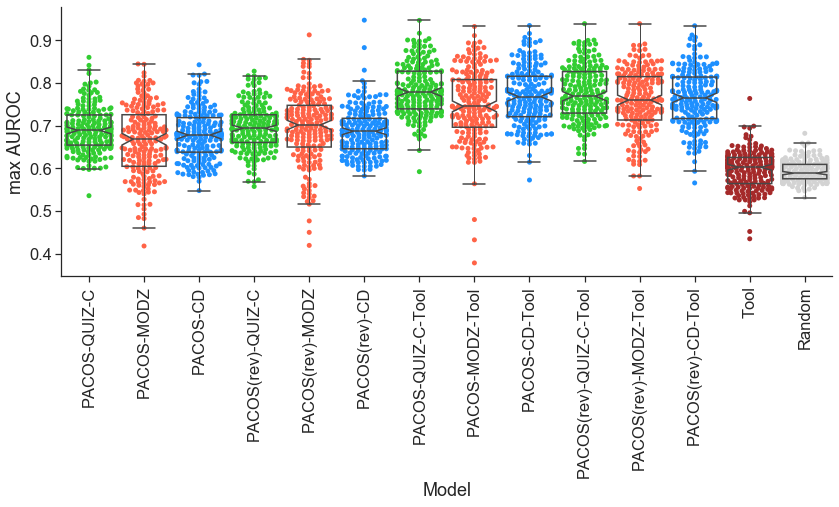

In [18]:
cols = ['limegreen', 'tomato', 'dodgerblue', 'limegreen', 'tomato', 'dodgerblue', 'limegreen', 'tomato', 'dodgerblue', 
        'limegreen', 'tomato', 'dodgerblue', 'brown', 'lightgrey']
fig = plt.figure()
fig.set_size_inches(12, 9)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    # plot swarmplot
    ax = sns.swarmplot(x='Model', y='AUROC', data=all_aurocs_concat_df, zorder=0, palette=cols, alpha=1.0)
    # plot boxplot
    sns.boxplot(x='Model', y='AUROC', data=all_aurocs_concat_df, showcaps=True, notch=True, boxprops={'facecolor':'None'}, showfliers=False, 
                whiskerprops={'linewidth':1}, ax=ax)
    plt.xticks(rotation=90)
    #plt.ylim(0.40, 0.90)
    plt.tight_layout()
    plt.xticks(np.arange(0, 14),  ['PACOS-QUIZ-C', 'PACOS-MODZ', 'PACOS-CD', 'PACOS(rev)-QUIZ-C', 'PACOS(rev)-MODZ', 'PACOS(rev)-CD', 
                                  'PACOS-QUIZ-C-Tool', 'PACOS-MODZ-Tool', 'PACOS-CD-Tool', 
                                  'PACOS(rev)-QUIZ-C-Tool', 'PACOS(rev)-MODZ-Tool', 'PACOS(rev)-CD-Tool',
                                   'Tool', 'Random'])
    sns.despine()
    plt.ylabel('max AUROC')
    plt.savefig(proj_output_path + 'master_AUROC_comparisons.pdf', format='pdf')
    plt.show()

In [17]:
print(np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_Spearman_rho']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_Spearman_rho']['AUROC']))
print(np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho_reverse']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_Spearman_rho_reverse']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_Spearman_rho_reverse']['AUROC']))
print(np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_tool_combined']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_tool_combined']['AUROC']))
print(np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined_reverse']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_tool_combined_reverse']['AUROC']),
      np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_tool_combined_reverse']['AUROC']))
print(np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'Tool_only']['AUROC']))
print(np.mean(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'Random']['AUROC']))

0.6914194084846911 0.6632089816344683 0.6785430287757931
0.6957953535038963 0.6940356968858741 0.6871586661947058
0.7835369675895472 0.7475426285483685 0.7687143149084668
0.7756417334426808 0.7583276119366019 0.7651345365485067
0.5959105855695771
0.5926032244341215


In [19]:
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_Spearman_rho']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_Spearman_rho']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho_reverse']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_Spearman_rho_reverse']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho_reverse']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_Spearman_rho_reverse']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_tool_combined']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_tool_combined']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined_reverse']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_tool_combined_reverse']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined_reverse']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_tool_combined_reverse']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'Tool_only']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'Random']['AUROC']))

WilcoxonResult(statistic=6558.0, pvalue=0.00021319350124933954)
WilcoxonResult(statistic=7180.0, pvalue=0.003631518760353063)
WilcoxonResult(statistic=9247.0, pvalue=0.788066690460098)
WilcoxonResult(statistic=7738.0, pvalue=0.02809827968791361)
WilcoxonResult(statistic=5008.0, pvalue=1.3289831227329119e-08)
WilcoxonResult(statistic=6927.0, pvalue=0.0012309478184534218)
WilcoxonResult(statistic=6854.0, pvalue=0.0008847055105758216)
WilcoxonResult(statistic=7122.0, pvalue=0.0028582724457441844)
WilcoxonResult(statistic=8491.0, pvalue=0.21709772192664767)


In [20]:
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_Spearman_rho']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_tool_combined']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_Spearman_rho']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_tool_combined']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_Spearman_rho_reverse']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'QUIZ-C_PACOS_tool_combined_reverse']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_Spearman_rho_reverse']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'MODZ_PACOS_tool_combined_reverse']['AUROC']))
print(st.wilcoxon(all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_Spearman_rho_reverse']['AUROC'], 
                  all_aurocs_concat_df[all_aurocs_concat_df['Model'] == 'CD_PACOS_tool_combined_reverse']['AUROC']))

WilcoxonResult(statistic=541.0, pvalue=4.8574552479234834e-30)
WilcoxonResult(statistic=1904.0, pvalue=5.09600262594194e-22)
WilcoxonResult(statistic=630.0, pvalue=1.7781550910049342e-29)
WilcoxonResult(statistic=724.0, pvalue=6.904703516858239e-29)
WilcoxonResult(statistic=3604.0, pvalue=7.703149770009266e-14)
WilcoxonResult(statistic=1439.0, pvalue=1.3105015364898228e-24)


## Comparison with L1000CDS2 (Figures 6B-C)

### Forward/Enhance mode

100%|██████████| 194/194 [00:36<00:00,  5.30it/s]


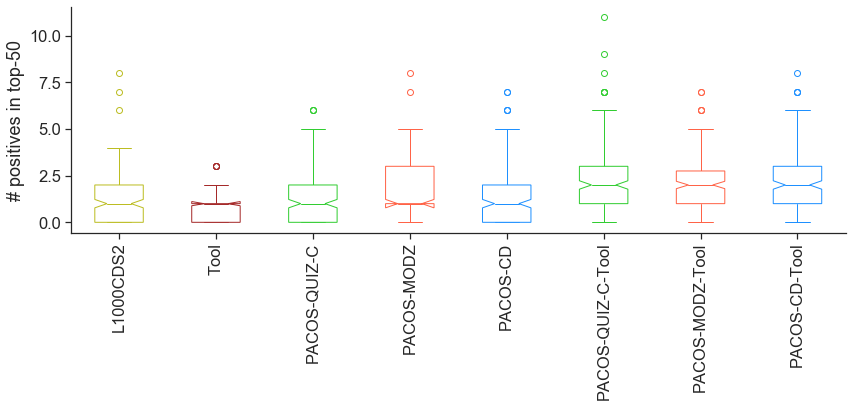

WilcoxonResult(statistic=1908.5, pvalue=4.267913525516923e-07)
WilcoxonResult(statistic=4690.0, pvalue=0.8176470238029013)
WilcoxonResult(statistic=2715.0, pvalue=2.2916331786018416e-06)
WilcoxonResult(statistic=3102.5, pvalue=0.001760823274632971)
WilcoxonResult(statistic=1855.0, pvalue=1.9145390661159603e-14)
WilcoxonResult(statistic=2417.5, pvalue=5.327153760729287e-06)
WilcoxonResult(statistic=2687.0, pvalue=5.334312696856598e-08)

1.2268041237113403 0.6752577319587629 1.2577319587628866 1.8041237113402062 1.577319587628866 2.4278350515463916 1.8298969072164948 1.9896907216494846


In [116]:
import requests
import json

url = 'http://amp.pharm.mssm.edu/L1000CDS2/query'

L1000CDS2_resGeneSet_dict = {}
L1000CDS2_result_df_dict = {}
L1000CDS2_top50_TPoverlap_dict = {}
for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):
    
    geneset_up = set(cgp_updn[geneset_name + '_UP'])
    geneset_dn = set(cgp_updn[geneset_name + '_DN'])   
    
    data = {"upGenes":list(geneset_up), "dnGenes":list(geneset_dn)}
    config = {"aggravate":True, "searchMethod":"geneSet", "share":False, "combination":False, "db-version":"latest"}
    #metadata = [{"key":"Tag","value":"gene-set python example"},{"key":"Cell","value":"PC3"}]
    payload = {"data":data,"config":config}
    headers = {'content-type':'application/json'}
    r = requests.post(url,data=json.dumps(payload),headers=headers)
    resGeneSet = r.json() 
    
    L1000CDS2_resGeneSet_dict[geneset_name] = resGeneSet
    
    pert_names = [resGeneSet['topMeta'][i]['pert_id'].upper() for i in range(len(resGeneSet['topMeta']))]
    top50_inames_df = pd.merge(pd.DataFrame(pert_names), L1000_pert_info, left_on=0, right_on='pert_id', how='left')
    
    L1000CDS2_result_df_dict[geneset_name] = top50_inames_df
    

    
    all_positives = set(QUIZC_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    
    L1000CDS2_top50_TPoverlap_dict[geneset_name] = len(set(top50_inames_df['pert_iname']) & set(all_positives))
    
with open(proj_intermediary_outputs_path + 'L1000CDS2_result_df_dict.pickle', 'wb') as handle:
    pickle.dump(L1000CDS2_result_df_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(proj_intermediary_outputs_path + 'L1000CDS2_top50_TPoverlap_dict.pickle', 'wb') as handle:
    pickle.dump(L1000CDS2_top50_TPoverlap_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

QUIZC_top50_TPoverlap_dict = {}
QUIZC_top50_TPoverlap_dict_tool = {}
QUIZC_top50_TPoverlap_dict_combined = {}
MODZ_top50_TPoverlap_dict = {}
MODZ_top50_TPoverlap_dict_tool = {}
MODZ_top50_TPoverlap_dict_combined = {}
CD_top50_TPoverlap_dict = {}
CD_top50_TPoverlap_dict_tool = {}
CD_top50_TPoverlap_dict_combined = {}

for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):
    
    QUIZC_pacos_tool_merged_df = pd.read_csv(proj_benchmark_path + 'QUIZ-C_%s_r2.csv' % geneset_name)
    MODZ_pacos_tool_merged_df = pd.read_csv(proj_benchmark_path + 'MODZ_%s_r2.csv' % geneset_name)
    CD_pacos_tool_merged_df = pd.read_csv(proj_benchmark_path + 'CD_%s_r2.csv' % geneset_name)
     
    QUIZC_ranked_df = QUIZC_pacos_tool_merged_df.sort_values('PACOS_Spearman_rho', ascending=False)  
    QUIZC_ranked_df_tool = QUIZC_pacos_tool_merged_df.sort_values('tool_score_imputed', ascending=False)  
    QUIZC_ranked_df_combined = QUIZC_pacos_tool_merged_df.sort_values('PACOS_tool_combined', ascending=False)  
    MODZ_ranked_df = MODZ_pacos_tool_merged_df.sort_values('PACOS_Spearman_rho', ascending=False)  
    MODZ_ranked_df_tool = MODZ_pacos_tool_merged_df.sort_values('tool_score_imputed', ascending=False)  
    MODZ_ranked_df_combined = MODZ_pacos_tool_merged_df.sort_values('PACOS_tool_combined', ascending=False)  
    CD_ranked_df = CD_pacos_tool_merged_df.sort_values('PACOS_Spearman_rho', ascending=False)  
    CD_ranked_df_tool = CD_pacos_tool_merged_df.sort_values('tool_score_imputed', ascending=False)  
    CD_ranked_df_combined = CD_pacos_tool_merged_df.sort_values('PACOS_tool_combined', ascending=False)  
 
    geneset_up = set(cgp_updn[geneset_name + '_UP'])
    geneset_dn = set(cgp_updn[geneset_name + '_DN']) 
    
    QUIZC_all_positives = set(QUIZC_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    MODZ_all_positives = set(MODZ_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    CD_all_positives = set(CD_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    
    QUIZC_top50_TPoverlap_dict[geneset_name] = len(set(QUIZC_ranked_df[0:50]['Pert_iname']) & set(QUIZC_all_positives))
    QUIZC_top50_TPoverlap_dict_tool[geneset_name] = len(set(QUIZC_ranked_df_tool[0:50]['Pert_iname']) & set(QUIZC_all_positives))
    QUIZC_top50_TPoverlap_dict_combined[geneset_name] = len(set(QUIZC_ranked_df_combined[0:50]['Pert_iname']) & set(QUIZC_all_positives))
    MODZ_top50_TPoverlap_dict[geneset_name] = len(set(MODZ_ranked_df[0:50]['Pert_iname']) & set(MODZ_all_positives))
    MODZ_top50_TPoverlap_dict_tool[geneset_name] = len(set(MODZ_ranked_df_tool[0:50]['Pert_iname']) & set(MODZ_all_positives))
    MODZ_top50_TPoverlap_dict_combined[geneset_name] = len(set(MODZ_ranked_df_combined[0:50]['Pert_iname']) & set(MODZ_all_positives))
    CD_top50_TPoverlap_dict[geneset_name] = len(set(CD_ranked_df[0:50]['Pert_iname']) & set(CD_all_positives))
    CD_top50_TPoverlap_dict_tool[geneset_name] = len(set(CD_ranked_df_tool[0:50]['Pert_iname']) & set(CD_all_positives))
    CD_top50_TPoverlap_dict_combined[geneset_name] = len(set(CD_ranked_df_combined[0:50]['Pert_iname']) & set(CD_all_positives))
    
fig = plt.figure()
fig.set_size_inches(12, 6)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):

    box1 = plt.boxplot(L1000CDS2_top50_TPoverlap_dict.values(), widths=0.5, positions=[1], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='tab:olive')
    plt.setp(box1["boxes"], facecolor='white')
    plt.setp(box1["fliers"], markeredgecolor='tab:olive') 
    
    box2 = plt.boxplot(QUIZC_top50_TPoverlap_dict_tool.values(), widths=0.5, positions=[2], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='brown')
    plt.setp(box2["boxes"], facecolor='white')
    plt.setp(box2["fliers"], markeredgecolor='brown') 
    
    box3 = plt.boxplot(QUIZC_top50_TPoverlap_dict.values(), widths=0.5, positions=[3], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='limegreen')
    plt.setp(box3["boxes"], facecolor='white')
    plt.setp(box3["fliers"], markeredgecolor='limegreen')  
    
    box4 = plt.boxplot(MODZ_top50_TPoverlap_dict.values(), widths=0.5, positions=[4], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box4[item], color='tomato')
    plt.setp(box4["boxes"], facecolor='white')
    plt.setp(box4["fliers"], markeredgecolor='tomato')   
    
    box5 = plt.boxplot(CD_top50_TPoverlap_dict.values(), widths=0.5, positions=[5], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box5[item], color='dodgerblue')
    plt.setp(box5["boxes"], facecolor='white')
    plt.setp(box5["fliers"], markeredgecolor='dodgerblue') 
    
    box6 = plt.boxplot(QUIZC_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[6], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box6[item], color='limegreen')
    plt.setp(box6["boxes"], facecolor='white')
    plt.setp(box6["fliers"], markeredgecolor='limegreen')  
    
    box7 = plt.boxplot(MODZ_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[7], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box7[item], color='tomato')
    plt.setp(box7["boxes"], facecolor='white')
    plt.setp(box7["fliers"], markeredgecolor='tomato')   
    
    box8 = plt.boxplot(CD_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[8], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box8[item], color='dodgerblue')
    plt.setp(box8["boxes"], facecolor='white')
    plt.setp(box8["fliers"], markeredgecolor='dodgerblue')   
    
    plt.xticks(np.arange(1, 9),  ['L1000CDS2', 'Tool', 'PACOS-QUIZ-C', 'PACOS-MODZ', 'PACOS-CD', 
                                  'PACOS-QUIZ-C-Tool', 'PACOS-MODZ-Tool', 'PACOS-CD-Tool'])
    plt.xticks(rotation=90)
    plt.ylabel('# positives in top-50')

    plt.tight_layout()
    sns.despine()
    plt.savefig(proj_output_path + 'L1000CDS2_vs_allmethods_top50.pdf', format='pdf')   
    plt.show()

    
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(QUIZC_top50_TPoverlap_dict_tool.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(QUIZC_top50_TPoverlap_dict.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(MODZ_top50_TPoverlap_dict.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(CD_top50_TPoverlap_dict.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(QUIZC_top50_TPoverlap_dict_combined.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(MODZ_top50_TPoverlap_dict_combined.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(CD_top50_TPoverlap_dict_combined.values())))
print()
print(np.mean(list(L1000CDS2_top50_TPoverlap_dict.values())), np.mean(list(QUIZC_top50_TPoverlap_dict_tool.values())), 
      np.mean(list(QUIZC_top50_TPoverlap_dict.values())), np.mean(list(MODZ_top50_TPoverlap_dict.values())),
     np.mean(list(CD_top50_TPoverlap_dict.values())), np.mean(list(QUIZC_top50_TPoverlap_dict_combined.values())),
      np.mean(list(MODZ_top50_TPoverlap_dict_combined.values())), np.mean(list(CD_top50_TPoverlap_dict_combined.values())))

### Reverse/Repress mode

100%|██████████| 194/194 [00:36<00:00,  5.34it/s]


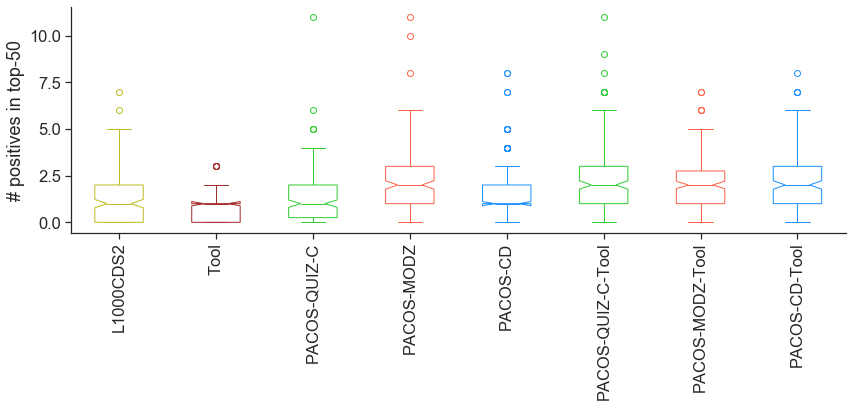

WilcoxonResult(statistic=2260.5, pvalue=5.246457936080627e-08)
WilcoxonResult(statistic=4416.5, pvalue=0.9282990612566278)
WilcoxonResult(statistic=2636.0, pvalue=7.491096029072112e-10)
WilcoxonResult(statistic=3622.5, pvalue=0.011008570332255562)
WilcoxonResult(statistic=2376.0, pvalue=5.31923269608537e-11)
WilcoxonResult(statistic=4085.5, pvalue=0.0005603740509833381)
WilcoxonResult(statistic=3618.0, pvalue=1.6877839165384463e-05)

1.2989690721649485 0.6752577319587629 1.3402061855670102 2.154639175257732 1.6546391752577319 2.4278350515463916 1.8298969072164948 1.9896907216494846


In [117]:
url = 'http://amp.pharm.mssm.edu/L1000CDS2/query'

L1000CDS2_resGeneSet_dict = {}
L1000CDS2_result_df_dict = {}
L1000CDS2_top50_TPoverlap_dict = {}
for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):
    
    geneset_up = set(cgp_updn[geneset_name + '_UP'])
    geneset_dn = set(cgp_updn[geneset_name + '_DN'])   
    
    data = {"upGenes":list(geneset_up), "dnGenes":list(geneset_dn)}
    config = {"aggravate":False, "searchMethod":"geneSet", "share":False, "combination":False, "db-version":"latest"}
    #metadata = [{"key":"Tag","value":"gene-set python example"},{"key":"Cell","value":"PC3"}]
    payload = {"data":data,"config":config}
    headers = {'content-type':'application/json'}
    r = requests.post(url,data=json.dumps(payload),headers=headers)
    resGeneSet = r.json() 
    
    L1000CDS2_resGeneSet_dict[geneset_name] = resGeneSet
    
    pert_names = [resGeneSet['topMeta'][i]['pert_id'].upper() for i in range(len(resGeneSet['topMeta']))]
    top50_inames_df = pd.merge(pd.DataFrame(pert_names), L1000_pert_info, left_on=0, right_on='pert_id', how='left')
    
    L1000CDS2_result_df_dict[geneset_name] = top50_inames_df
    

    
    all_positives = set(QUIZC_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    
    L1000CDS2_top50_TPoverlap_dict[geneset_name] = len(set(top50_inames_df['pert_iname']) & set(all_positives))
    
with open(proj_intermediary_outputs_path + 'L1000CDS2_reverse_result_df_dict.pickle', 'wb') as handle:
    pickle.dump(L1000CDS2_result_df_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(proj_intermediary_outputs_path + 'L1000CDS2_reverse_top50_TPoverlap_dict.pickle', 'wb') as handle:
    pickle.dump(L1000CDS2_top50_TPoverlap_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
    
QUIZC_top50_TPoverlap_dict = {}
QUIZC_top50_TPoverlap_dict_tool = {}
QUIZC_top50_TPoverlap_dict_combined = {}
MODZ_top50_TPoverlap_dict = {}
MODZ_top50_TPoverlap_dict_tool = {}
MODZ_top50_TPoverlap_dict_combined = {}
CD_top50_TPoverlap_dict = {}
CD_top50_TPoverlap_dict_tool = {}
CD_top50_TPoverlap_dict_combined = {}

for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):
    
    QUIZC_pacos_tool_merged_df = pd.read_csv(proj_benchmark_path + 'QUIZ-C_%s_r2.csv' % geneset_name)
    MODZ_pacos_tool_merged_df = pd.read_csv(proj_benchmark_path + 'MODZ_%s_r2.csv' % geneset_name)
    CD_pacos_tool_merged_df = pd.read_csv(proj_benchmark_path + 'CD_%s_r2.csv' % geneset_name)
     
    QUIZC_ranked_df = QUIZC_pacos_tool_merged_df.sort_values('PACOS_Spearman_rho_reverse', ascending=False)  
    QUIZC_ranked_df_tool = QUIZC_pacos_tool_merged_df.sort_values('tool_score_imputed', ascending=False)  
    QUIZC_ranked_df_combined = QUIZC_pacos_tool_merged_df.sort_values('PACOS_tool_combined', ascending=False)  
    MODZ_ranked_df = MODZ_pacos_tool_merged_df.sort_values('PACOS_Spearman_rho_reverse', ascending=False)  
    MODZ_ranked_df_tool = MODZ_pacos_tool_merged_df.sort_values('tool_score_imputed', ascending=False)  
    MODZ_ranked_df_combined = MODZ_pacos_tool_merged_df.sort_values('PACOS_tool_combined', ascending=False)  
    CD_ranked_df = CD_pacos_tool_merged_df.sort_values('PACOS_Spearman_rho_reverse', ascending=False)  
    CD_ranked_df_tool = CD_pacos_tool_merged_df.sort_values('tool_score_imputed', ascending=False)  
    CD_ranked_df_combined = CD_pacos_tool_merged_df.sort_values('PACOS_tool_combined', ascending=False)  
 
    geneset_up = set(cgp_updn[geneset_name + '_UP'])
    geneset_dn = set(cgp_updn[geneset_name + '_DN']) 
    
    QUIZC_all_positives = set(QUIZC_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    MODZ_all_positives = set(MODZ_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    CD_all_positives = set(CD_alldrugs['Pert_iname']) & set(geneset_pert_iname_dict[geneset_name])
    
    QUIZC_top50_TPoverlap_dict[geneset_name] = len(set(QUIZC_ranked_df[0:50]['Pert_iname']) & set(QUIZC_all_positives))
    QUIZC_top50_TPoverlap_dict_tool[geneset_name] = len(set(QUIZC_ranked_df_tool[0:50]['Pert_iname']) & set(QUIZC_all_positives))
    QUIZC_top50_TPoverlap_dict_combined[geneset_name] = len(set(QUIZC_ranked_df_combined[0:50]['Pert_iname']) & set(QUIZC_all_positives))
    MODZ_top50_TPoverlap_dict[geneset_name] = len(set(MODZ_ranked_df[0:50]['Pert_iname']) & set(MODZ_all_positives))
    MODZ_top50_TPoverlap_dict_tool[geneset_name] = len(set(MODZ_ranked_df_tool[0:50]['Pert_iname']) & set(MODZ_all_positives))
    MODZ_top50_TPoverlap_dict_combined[geneset_name] = len(set(MODZ_ranked_df_combined[0:50]['Pert_iname']) & set(MODZ_all_positives))
    CD_top50_TPoverlap_dict[geneset_name] = len(set(CD_ranked_df[0:50]['Pert_iname']) & set(CD_all_positives))
    CD_top50_TPoverlap_dict_tool[geneset_name] = len(set(CD_ranked_df_tool[0:50]['Pert_iname']) & set(CD_all_positives))
    CD_top50_TPoverlap_dict_combined[geneset_name] = len(set(CD_ranked_df_combined[0:50]['Pert_iname']) & set(CD_all_positives))
    
    
fig = plt.figure()
fig.set_size_inches(12, 6)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):

    box1 = plt.boxplot(L1000CDS2_top50_TPoverlap_dict.values(), widths=0.5, positions=[1], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='tab:olive')
    plt.setp(box1["boxes"], facecolor='white')
    plt.setp(box1["fliers"], markeredgecolor='tab:olive') 
    
    box2 = plt.boxplot(QUIZC_top50_TPoverlap_dict_tool.values(), widths=0.5, positions=[2], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='brown')
    plt.setp(box2["boxes"], facecolor='white')
    plt.setp(box2["fliers"], markeredgecolor='brown') 
    
    box3 = plt.boxplot(QUIZC_top50_TPoverlap_dict.values(), widths=0.5, positions=[3], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='limegreen')
    plt.setp(box3["boxes"], facecolor='white')
    plt.setp(box3["fliers"], markeredgecolor='limegreen')  
    
    box4 = plt.boxplot(MODZ_top50_TPoverlap_dict.values(), widths=0.5, positions=[4], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box4[item], color='tomato')
    plt.setp(box4["boxes"], facecolor='white')
    plt.setp(box4["fliers"], markeredgecolor='tomato')   
    
    box5 = plt.boxplot(CD_top50_TPoverlap_dict.values(), widths=0.5, positions=[5], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box5[item], color='dodgerblue')
    plt.setp(box5["boxes"], facecolor='white')
    plt.setp(box5["fliers"], markeredgecolor='dodgerblue') 
    
    box6 = plt.boxplot(QUIZC_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[6], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box6[item], color='limegreen')
    plt.setp(box6["boxes"], facecolor='white')
    plt.setp(box6["fliers"], markeredgecolor='limegreen')  
    
    box7 = plt.boxplot(MODZ_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[7], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box7[item], color='tomato')
    plt.setp(box7["boxes"], facecolor='white')
    plt.setp(box7["fliers"], markeredgecolor='tomato')   
    
    box8 = plt.boxplot(CD_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[8], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box8[item], color='dodgerblue')
    plt.setp(box8["boxes"], facecolor='white')
    plt.setp(box8["fliers"], markeredgecolor='dodgerblue')   
    
    plt.xticks(np.arange(1, 9),  ['L1000CDS2', 'Tool', 'PACOS-QUIZ-C', 'PACOS-MODZ', 'PACOS-CD', 
                                  'PACOS-QUIZ-C-Tool', 'PACOS-MODZ-Tool', 'PACOS-CD-Tool'])
    plt.xticks(rotation=90)
    plt.ylabel('# positives in top-50')

    plt.tight_layout()
    sns.despine()
    plt.savefig(proj_output_path + 'L1000CDS2_vs_allmethods_top50_reverse.pdf', format='pdf')   
    plt.show()
    
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(QUIZC_top50_TPoverlap_dict_tool.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(QUIZC_top50_TPoverlap_dict.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(MODZ_top50_TPoverlap_dict.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(CD_top50_TPoverlap_dict.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(QUIZC_top50_TPoverlap_dict_combined.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(MODZ_top50_TPoverlap_dict_combined.values())))
print(st.wilcoxon(list(L1000CDS2_top50_TPoverlap_dict.values()), list(CD_top50_TPoverlap_dict_combined.values())))
print()
print(np.mean(list(L1000CDS2_top50_TPoverlap_dict.values())), np.mean(list(QUIZC_top50_TPoverlap_dict_tool.values())), 
      np.mean(list(QUIZC_top50_TPoverlap_dict.values())), np.mean(list(MODZ_top50_TPoverlap_dict.values())),
     np.mean(list(CD_top50_TPoverlap_dict.values())), np.mean(list(QUIZC_top50_TPoverlap_dict_combined.values())),
      np.mean(list(MODZ_top50_TPoverlap_dict_combined.values())), np.mean(list(CD_top50_TPoverlap_dict_combined.values())))

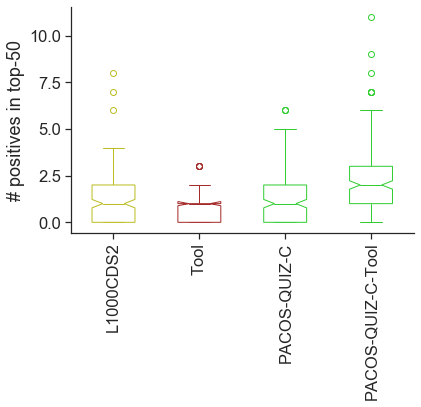

In [24]:
fig = plt.figure()
fig.set_size_inches(6, 6)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):

    box1 = plt.boxplot(L1000CDS2_top50_TPoverlap_dict.values(), widths=0.5, positions=[1], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='tab:olive')
    plt.setp(box1["boxes"], facecolor='white')
    plt.setp(box1["fliers"], markeredgecolor='tab:olive') 
    
    box2 = plt.boxplot(QUIZC_top50_TPoverlap_dict_tool.values(), widths=0.5, positions=[2], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='brown')
    plt.setp(box2["boxes"], facecolor='white')
    plt.setp(box2["fliers"], markeredgecolor='brown')  
    
    box3 = plt.boxplot(QUIZC_top50_TPoverlap_dict.values(), widths=0.5, positions=[3], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='limegreen')
    plt.setp(box3["boxes"], facecolor='white')
    plt.setp(box3["fliers"], markeredgecolor='limegreen')   
    
    box4 = plt.boxplot(QUIZC_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[4], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box4[item], color='limegreen')
    plt.setp(box4["boxes"], facecolor='white')
    plt.setp(box4["fliers"], markeredgecolor='limegreen')   
    
    plt.xticks(np.arange(1, 5),  ['L1000CDS2', 'Tool', 'PACOS-QUIZ-C', 'PACOS-QUIZ-C-Tool'])
    plt.xticks(rotation=90)
    plt.ylabel('# positives in top-50')

    plt.tight_layout()
    sns.despine()
    plt.savefig(proj_output_path + 'L1000CDS2_vs_QUIZ-C_top50.pdf', format='pdf')   
    plt.show()

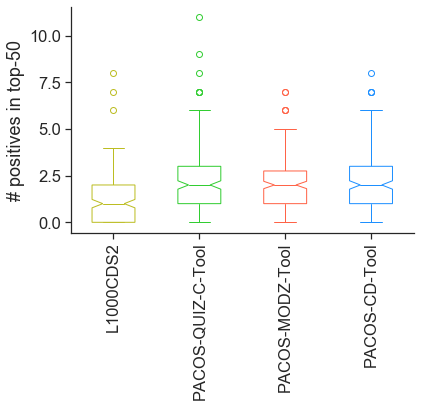

In [25]:
fig = plt.figure()
fig.set_size_inches(6, 6)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):

    box1 = plt.boxplot(L1000CDS2_top50_TPoverlap_dict.values(), widths=0.5, positions=[1], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='tab:olive')
    plt.setp(box1["boxes"], facecolor='white')
    plt.setp(box1["fliers"], markeredgecolor='tab:olive') 
    
    box2 = plt.boxplot(QUIZC_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[2], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='limegreen')
    plt.setp(box2["boxes"], facecolor='white')
    plt.setp(box2["fliers"], markeredgecolor='limegreen')  
    
    box3 = plt.boxplot(MODZ_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[3], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='tomato')
    plt.setp(box3["boxes"], facecolor='white')
    plt.setp(box3["fliers"], markeredgecolor='tomato')   
    
    box4 = plt.boxplot(CD_top50_TPoverlap_dict_combined.values(), widths=0.5, positions=[4], notch=True, patch_artist=True)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box4[item], color='dodgerblue')
    plt.setp(box4["boxes"], facecolor='white')
    plt.setp(box4["fliers"], markeredgecolor='dodgerblue')   
    
    plt.xticks(np.arange(1, 5),  ['L1000CDS2', 'PACOS-QUIZ-C-Tool', 'PACOS-MODZ-Tool', 'PACOS-CD-Tool'])
    plt.xticks(rotation=90)
    plt.ylabel('# positives in top-50')

    plt.tight_layout()
    sns.despine()
    plt.savefig(proj_output_path + 'L1000CDS2_vs_allmethods_combined_top50.pdf', format='pdf')   
    plt.show()


## Sensitivity analysis for combined ratio r (Supplementary Figure 12)

In [30]:
models = ['PACOS_tool_combined_var', 'PACOS_tool_combined_reverse_var']
Nir = 101
method_name = 'QUIZ-C'
median_AUROC_arr = {}
median_AUPRC_arr = {}
div_arr = {}

for m in models:
    
    temp_median_AUROC_arr = np.zeros(Nir)
    temp_median_AUPRC_arr = np.zeros(Nir)
    temp_div_arr = np.zeros(Nir)    
    
    for ir, r in enumerate(tqdm(np.linspace(0, 6, Nir), position=0, leave=True)):
        
        temp_geneset_median_AUROC_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=['AUROC'])
        temp_geneset_median_AUPRC_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=['AUPRC'])
        QUIZC_top50_alldrugs = set()
        
        for geneset_name in benchmark_genesets['Geneset_name'].to_numpy():
                       
            temp_pacos_tool_merged_df = pd.read_csv(proj_benchmark_path + '%s_%s_r2.csv' % (method_name, geneset_name))

            temp_pacos_tool_merged_df['PACOS_tool_combined_var'] = (r*temp_pacos_tool_merged_df['PACOS_Spearman_rho'] + 
                                                                    temp_pacos_tool_merged_df['tool_score_imputed']) / (r + 1.0)
            temp_pacos_tool_merged_df['PACOS_tool_combined_reverse_var'] = (-1.0*r*temp_pacos_tool_merged_df['PACOS_Spearman_rho'] + 
                                                                            temp_pacos_tool_merged_df['tool_score_imputed']) / (r + 1.0)

            model_sorted = temp_pacos_tool_merged_df.sort_values(m, ascending=False)    
            model_sorted_uniq = model_sorted['Pert_iname'].drop_duplicates()  
                       
            QUIZC_top50_alldrugs.update(set(temp_pacos_tool_merged_df.sort_values(m, ascending=False)[0:50]['Pert_iname']))
            
            
            (temp_geneset_median_AUROC_df.at[geneset_name, 'AUROC'], 
             temp_geneset_median_AUPRC_df.at[geneset_name, 'AUPRC']) = AUROC_AUPRC(model_sorted_uniq, 
                                                                                   geneset_pert_iname_dict[geneset_name], 
                                                                                   auc_threshold=5, binsize=1)
                  
        temp_div_arr[ir] = len(QUIZC_top50_alldrugs)           
        temp_median_AUROC_arr[ir] = temp_geneset_median_AUROC_df['AUROC'].median()
        temp_median_AUPRC_arr[ir] = temp_geneset_median_AUPRC_df['AUPRC'].median()
    
    div_arr[m] = temp_div_arr
    median_AUROC_arr[m] = temp_median_AUROC_arr
    median_AUPRC_arr[m] = temp_median_AUPRC_arr
    
with open(proj_intermediary_outputs_path +'div_arr.pickle', 'wb') as fp:
    pickle.dump(div_arr, fp, protocol=pickle.HIGHEST_PROTOCOL)
with open(proj_intermediary_outputs_path +'median_AUROC_arr.pickle', 'wb') as fp:
    pickle.dump(median_AUROC_arr, fp, protocol=pickle.HIGHEST_PROTOCOL)
with open(proj_intermediary_outputs_path +'median_AUPRC_arr.pickle', 'wb') as fp:
    pickle.dump(median_AUPRC_arr, fp, protocol=pickle.HIGHEST_PROTOCOL)

100%|██████████| 101/101 [5:56:32<00:00, 211.80s/it] 


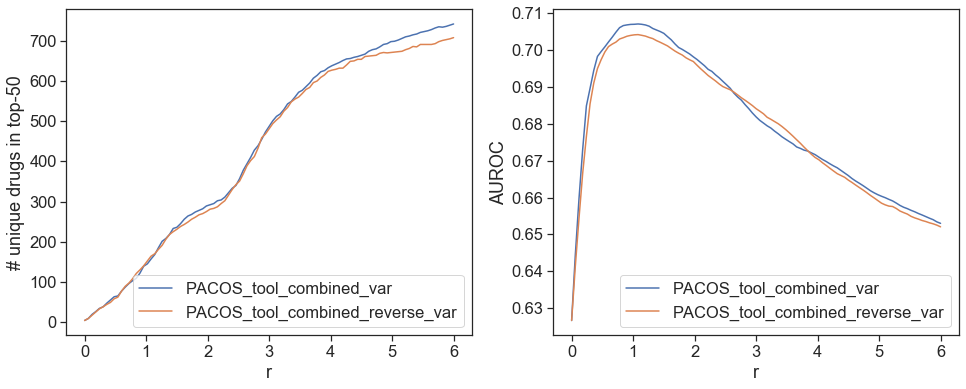

In [88]:
fig = plt.figure()
fig.set_size_inches(16, 6)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    plt.subplot(1, 2, 1)
    for m in div_arr.keys():
        plt.plot(np.linspace(0, 6, Nir), div_arr[m], label=m)
    plt.xlabel('r')
    plt.legend()
    plt.ylabel('# unique drugs in top-50')
    
    plt.subplot(1, 2, 2)
    for m in median_AUROC_arr.keys():
        plt.plot(np.linspace(0, 6, Nir), median_AUROC_arr[m], label=m)
    plt.xlabel('r')
    plt.legend()
    plt.ylabel('AUROC')
    
    plt.savefig(proj_output_path + 'r_sensitivity_top50_%s.pdf' % m, format='pdf')    
    plt.show()

## Supplementary Figure 13

100%|██████████| 194/194 [00:47<00:00,  4.12it/s]


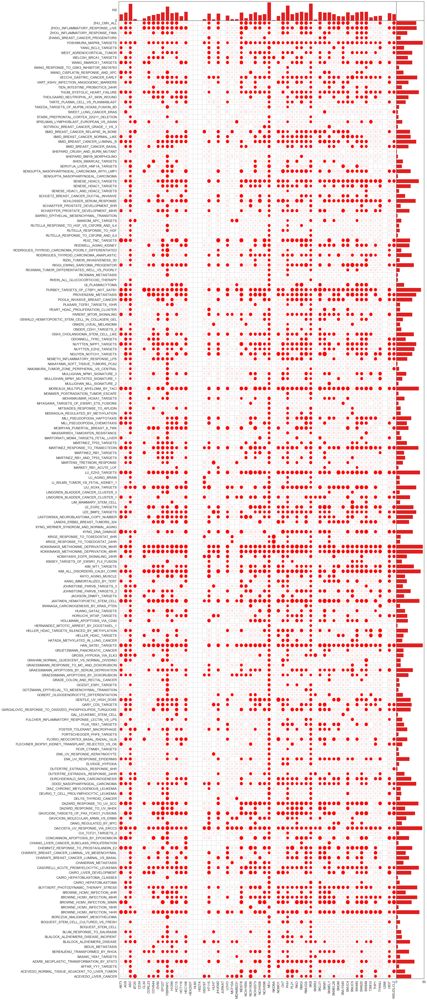

60 54
90.0


In [171]:
method_name = 'QUIZ-C'
m = 'PACOS_tool_combined'

temp_auroc_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=QUIZC_allcells['Cell_type'])
temp_auroc_emp_pval_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=QUIZC_allcells['Cell_type'])
cols_df = pd.DataFrame(0.0, index=benchmark_genesets['Geneset_name'].to_numpy(), columns=QUIZC_allcells['Cell_type'])

for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):

    temp_nested = pd.read_csv(proj_benchmark_path + 'Nested_%s_%s_r2.csv' % (method_name, geneset_name))
    for c in temp_nested['Cell_type'].unique():
        temp_auroc_df.at[geneset_name, c] = temp_nested[temp_nested['Cell_type']==c]['%s_AUROC' % m].unique()[0]
        temp_auroc_emp_pval_df.at[geneset_name, c] = temp_nested[temp_nested['Cell_type']==c]['%s_AUROC_emp_pval' % m].unique()[0]
        if temp_auroc_emp_pval_df.at[geneset_name, c] < 0.05: 
            cols_df.at[geneset_name, c] = 1.0

temp_auroc_df_nonan = temp_auroc_df.fillna(0.0)

N = temp_auroc_df.shape[0]
M = temp_auroc_df.shape[1]
ylabels = temp_auroc_df.index.values
xlabels = temp_auroc_df.columns.values

x, y = np.meshgrid(np.arange(M), np.arange(N))
s = temp_auroc_df_nonan.values
c = cols_df.values # color could be based on whether the cell type significant or not based on the randomizations
my_cmap = sns.light_palette('Red', as_cmap=True)

sns.set(font_scale=1.5)
with sns.axes_style("white"):
    
    f, axs = plt.subplots(2, 2, figsize=(30, 70), gridspec_kw=dict(height_ratios=[0.02, 1], width_ratios=[1, 0.1], hspace=0, wspace=0))
    sns.barplot(x=cols_df.columns, y=cols_df.sum(axis=0), ax=axs[0, 0], color='red')
    plt.setp(axs[0, 0].get_xticklabels(), visible=False)
    
    plt.setp(axs[0, 1].get_xticklabels(), visible=False)
    plt.setp(axs[0, 1].get_yticklabels(), visible=False)

    R = s/2
    circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]
    col = PatchCollection(circles, array=c.flatten(), cmap=my_cmap)
    axs[1, 0].add_collection(col)

    axs[1, 0].set(xticks=np.arange(M), yticks=np.arange(N),
           xticklabels=xlabels, yticklabels=ylabels)
    axs[1, 0].set_xticks(np.arange(M+1)-0.5, minor=True)
    axs[1, 0].set_yticks(np.arange(N+1)-0.5, minor=True)
    axs[1, 0].set_xticklabels(labels=xlabels, rotation=90)
    axs[1, 0].grid(which='minor')
    

    sns.barplot(x=cols_df.sort_index(ascending=False).sum(axis=1), y=cols_df.sort_index(ascending=False).index, ax=axs[1, 1], color='red')
    plt.setp(axs[1, 1].get_yticklabels(), visible=False)

    #fig.colorbar(col)
    #sns.despine()
    plt.tight_layout()
    plt.savefig(proj_output_path + 'auroc_circle_heatmap_%s_%s.pdf' % (method_name, m), format='pdf')
    plt.show()
    
print(len(cols_df.columns), len(cols_df.sum(axis=0)[cols_df.sum(axis=0)>0.0]))
print(len(cols_df.sum(axis=0)[cols_df.sum(axis=0)>0.0]) / len(cols_df.columns) * 100)

100%|██████████| 194/194 [00:48<00:00,  3.98it/s]


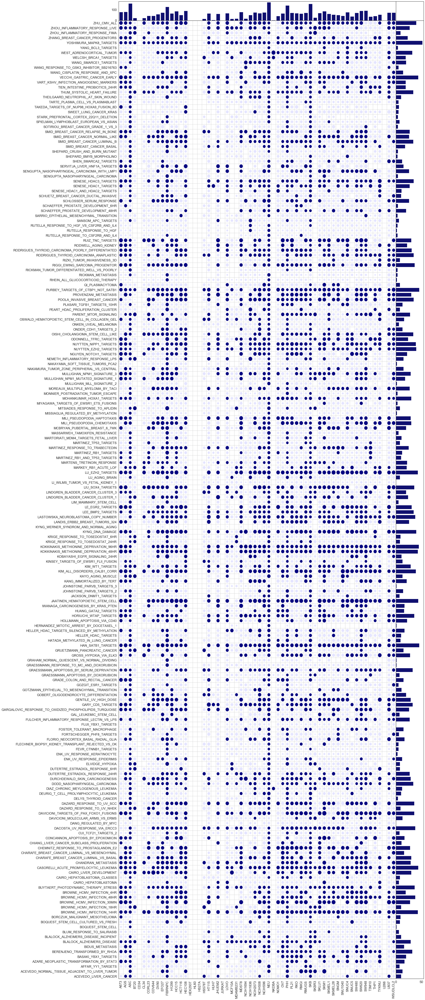

60 54
90.0


In [172]:
method_name = 'QUIZ-C'
m = 'PACOS_tool_combined_reverse'

temp_auroc_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=QUIZC_allcells['Cell_type'])
temp_auroc_emp_pval_df = pd.DataFrame(index=benchmark_genesets['Geneset_name'].to_numpy(), columns=QUIZC_allcells['Cell_type'])
cols_df = pd.DataFrame(0.0, index=benchmark_genesets['Geneset_name'].to_numpy(), columns=QUIZC_allcells['Cell_type'])

for geneset_name in tqdm(benchmark_genesets['Geneset_name'].to_numpy(), position=0, leave=True):

    temp_nested = pd.read_csv(proj_benchmark_path + 'Nested_%s_%s_r2.csv' % (method_name, geneset_name))
    for c in temp_nested['Cell_type'].unique():
        temp_auroc_df.at[geneset_name, c] = temp_nested[temp_nested['Cell_type']==c]['%s_AUROC' % m].unique()[0]
        temp_auroc_emp_pval_df.at[geneset_name, c] = temp_nested[temp_nested['Cell_type']==c]['%s_AUROC_emp_pval' % m].unique()[0]
        if temp_auroc_emp_pval_df.at[geneset_name, c] < 0.05: 
            cols_df.at[geneset_name, c] = 1.0

temp_auroc_df_nonan = temp_auroc_df.fillna(0.0)

N = temp_auroc_df.shape[0]
M = temp_auroc_df.shape[1]
ylabels = temp_auroc_df.index.values
xlabels = temp_auroc_df.columns.values

x, y = np.meshgrid(np.arange(M), np.arange(N))
s = temp_auroc_df_nonan.values
c = cols_df.values # color could be based on whether the cell type significant or not based on the randomizations
my_cmap = sns.light_palette('Navy', as_cmap=True)

sns.set(font_scale=1.5)
with sns.axes_style("white"):
    
    f, axs = plt.subplots(2, 2, figsize=(30, 70), gridspec_kw=dict(height_ratios=[0.02, 1], width_ratios=[1, 0.1], hspace=0, wspace=0))
    sns.barplot(x=cols_df.columns, y=cols_df.sum(axis=0), ax=axs[0, 0], color='Navy')
    plt.setp(axs[0, 0].get_xticklabels(), visible=False)
    
    plt.setp(axs[0, 1].get_xticklabels(), visible=False)
    plt.setp(axs[0, 1].get_yticklabels(), visible=False)

    R = s/2
    circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]
    col = PatchCollection(circles, array=c.flatten(), cmap=my_cmap)
    axs[1, 0].add_collection(col)

    axs[1, 0].set(xticks=np.arange(M), yticks=np.arange(N),
           xticklabels=xlabels, yticklabels=ylabels)
    axs[1, 0].set_xticks(np.arange(M+1)-0.5, minor=True)
    axs[1, 0].set_yticks(np.arange(N+1)-0.5, minor=True)
    axs[1, 0].set_xticklabels(labels=xlabels, rotation=90)
    axs[1, 0].grid(which='minor')
    

    sns.barplot(x=cols_df.sort_index(ascending=False).sum(axis=1), y=cols_df.sort_index(ascending=False).index, ax=axs[1, 1], color='Navy')
    plt.setp(axs[1, 1].get_yticklabels(), visible=False)

    #fig.colorbar(col)
    #sns.despine()
    plt.tight_layout()
    plt.savefig(proj_output_path + 'auroc_circle_heatmap_%s_%s.pdf' % (method_name, m), format='pdf')
    plt.show()
    
print(len(cols_df.columns), len(cols_df.sum(axis=0)[cols_df.sum(axis=0)>0.0]))
print(len(cols_df.sum(axis=0)[cols_df.sum(axis=0)>0.0]) / len(cols_df.columns) * 100)

## Tanimoto coefficient plots (Supp. Figs. 14-17)

**RESULT** In 146/194 benchmark inputs, QRZC has significantly (two-sided MWU pval <=0.05) lower Tanimoto similarity (therefore higher structural diversity) in the top-50 predicted drugs than either LCB (red), CD (blue) or both LCB and CD (green). For the remaining 48, QRZC has either higher Tanimoto similarity than either, or it has lower similarity but the difference is not significant. <br>
**Update - Comparison of QRZC with L1000CDS2:** 116/194 (124/194 if using the S score ranking only) phenotypes have significantly lower Tanimoto similarity (therefore higher structural diversity) in the top-50 predicted drugs in QRZC compared to L1000CDS2 top-50. By contrast, 60/194 (48 if using the S-score ranking only) phenotypes have significantly lower Tanimoto similarity (therefore higher structural diversity) in the top-50 predicted drugs in L1000CDS2 compared to QRZC's top-50.  <br>
Considering that L1000CDS2 has many more unique drugs in the top-50 combined compared to QRZC (~1157 vs ~ 289), it is expected that it will have higher chemical diversity compared to QRZC, but that is not the case. Indeed, when we use the S-score rankings only, the structural diversity is further improved from 116/60 to 124/48 as there is a higher number of unique drugs in the top 50 ranked drugs in this case (853 vs 289). <br>

In [37]:
QUIZC_cids_inchi_smiles = pd.read_csv(proj_intermediary_outputs_path + 'QUIZC_drug_CIDs_inchi_smiles.csv')

In [38]:
benchmark_genesets = pd.read_csv(input_paths_dict['benchmark_genesets_path'], header=None).rename(columns={0: 'Geneset_name'})

In [39]:
apfp_Tanimoto_QUIZC = pd.read_csv(proj_intermediary_outputs_path + 'APFPsim_Tanimoto_scores_QRZC_cids_inchi_smiles.csv')
apfp_Tanimoto_QUIZC['Compound A'] = apfp_Tanimoto_QUIZC['Compound A'].astype('float')
apfp_Tanimoto_QUIZC['Compound B'] = apfp_Tanimoto_QUIZC['Compound B'].astype('float')

apfp_Tanimoto_QUIZC_pert_iname = pd.merge(pd.merge(apfp_Tanimoto_QUIZC, QUIZC_cids_inchi_smiles, how='left', left_on='Compound A', 
                                                  right_on='pubchem_cid_x'), QUIZC_cids_inchi_smiles, how='left', left_on='Compound B', 
                                         right_on='pubchem_cid_x')[['Compound A', 'Compound B', 'Pert_iname_x', 
                                                                    'Pert_iname_y', 'Tanimoto coefficient']]
apfp_Tanimoto_QUIZC_pert_cid_dict = {}
for i, j, k in apfp_Tanimoto_QUIZC_pert_iname[['Compound A', 'Compound B', 'Tanimoto coefficient']].values:
    apfp_Tanimoto_QUIZC_pert_cid_dict[(i, j)] = k
    apfp_Tanimoto_QUIZC_pert_cid_dict[(j, i)] = k

100%|██████████| 194/194 [02:27<00:00,  1.31it/s]


146


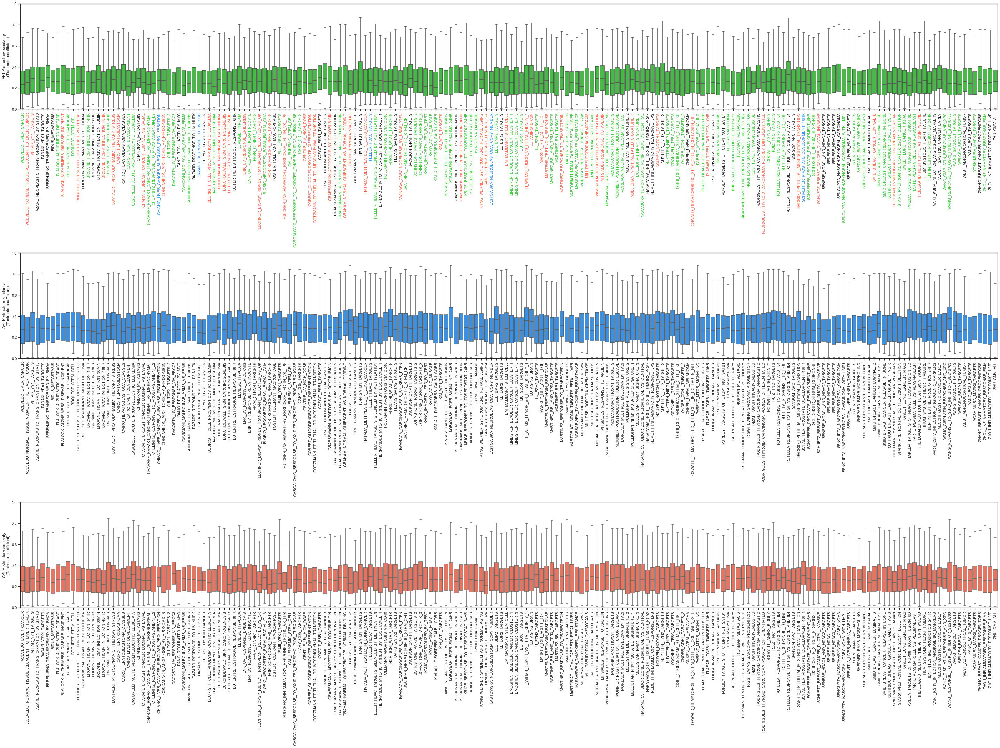

In [43]:
model = 'PACOS_tool_combined'
QUIZC_top50_tanimoto_dict = get_topN_tanimoto(proj_benchmark_path, benchmark_genesets, apfp_Tanimoto_QUIZC_pert_iname, method_name='QUIZ-C', 
                                              model=model, topN=50)

MODZ_top50_tanimoto_dict = get_topN_tanimoto(proj_benchmark_path, benchmark_genesets, apfp_Tanimoto_QUIZC_pert_iname, method_name='MODZ', 
                                             model=model, topN=50)

CD_top50_tanimoto_dict = get_topN_tanimoto(proj_benchmark_path, benchmark_genesets, apfp_Tanimoto_QUIZC_pert_iname, method_name='CD', 
                                           model=model, topN=50)

QUIZC_top50_tanimoto_dict_labels, QUIZC_top50_tanimoto_dict_data = [*zip(*QUIZC_top50_tanimoto_dict.items())]
MODZ_top50_tanimoto_dict_labels, MODZ_top50_tanimoto_dict_data = [*zip(*MODZ_top50_tanimoto_dict.items())]
CD_top50_tanimoto_dict_labels, CD_top50_tanimoto_dict_data = [*zip(*CD_top50_tanimoto_dict.items())]

colors = []
for x_QUIZC, x_MODZ, x_CD in zip(QUIZC_top50_tanimoto_dict_data, MODZ_top50_tanimoto_dict_data, CD_top50_tanimoto_dict_data):
    if (((np.mean(x_QUIZC) - np.mean(x_CD) < 0) & (st.mannwhitneyu(x_QUIZC, x_CD)[1] <= 0.05)) & 
        ((np.mean(x_QUIZC) - np.mean(x_MODZ) < 0) & (st.mannwhitneyu(x_QUIZC, x_MODZ)[1] <= 0.05))):
        colors.append('limegreen')
    elif ((np.mean(x_QUIZC) - np.mean(x_CD) < 0) & (st.mannwhitneyu(x_QUIZC, x_CD)[1] <= 0.05)):
        colors.append('dodgerblue')
    elif ((np.mean(x_QUIZC) - np.mean(x_MODZ) < 0) & (st.mannwhitneyu(x_QUIZC, x_MODZ)[1] <= 0.05)):
        colors.append('tomato')
    else:
        colors.append('k')
print(sum([(c=='limegreen') | (c=='dodgerblue') | (c=='tomato')  for c in colors]))

fig = plt.figure()
fig.set_size_inches(40, 30)
sns.set(font_scale=1.0)
with sns.axes_style("ticks"):
    ax1 = plt.subplot(311)
    sns.boxplot(data=QUIZC_top50_tanimoto_dict_data, color='limegreen', showfliers = False)
    for color, tick in zip(colors, ax1.xaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.ylim(0.0, 1.0)
    plt.xticks(rotation=90)
    plt.xticks(range(0, len(QUIZC_top50_tanimoto_dict_labels)), QUIZC_top50_tanimoto_dict_labels)
    plt.ylabel('APFP structure similarity\n(Tanimoto coefficient)')
    
    ax2 = plt.subplot(312)
    sns.boxplot(data=MODZ_top50_tanimoto_dict_data, color='dodgerblue', showfliers = False)
    plt.ylim(0.0, 1.0)
    plt.xticks(rotation=90)
    plt.xticks(range(0, len(MODZ_top50_tanimoto_dict_labels)), MODZ_top50_tanimoto_dict_labels)
    plt.ylabel('APFP structure similarity\n(Tanimoto coefficient)')
    
    ax3 = plt.subplot(313)
    sns.boxplot(data=CD_top50_tanimoto_dict_data, color='tomato', showfliers = False)
    plt.ylim(0.0, 1.0)
    plt.xticks(rotation=90)
    plt.xticks(range(0, len(CD_top50_tanimoto_dict_labels)), CD_top50_tanimoto_dict_labels)
    plt.ylabel('APFP structure similarity\n(Tanimoto coefficient)')
    
    plt.tight_layout()
    plt.savefig(proj_output_path + 'QUIZC-MODZ-CD_Top50_Tanimoto_%s.pdf' % model, format='pdf')

## Chemical diversity of L1000CDS2 predicted drugs

### Total number of drugs predicted in top 50 in each method, across all input genesets

In [49]:
QUIZC_top50_alldrugs = get_topN_drugs(proj_benchmark_path, benchmark_genesets, method_name='QUIZ-C', model='PACOS_tool_combined', topN=50)
L1000CDS2_top50_alldrugs = get_topN_drugs(proj_intermediary_outputs_path, benchmark_genesets, method_name='L1000CDS2', model='PACOS_tool_combined', 
                                          topN=50)

100%|██████████| 194/194 [00:00<00:00, 19885.50it/s]


In [50]:
len(L1000CDS2_top50_alldrugs), len(QUIZC_top50_alldrugs)

(1157, 345)

In [51]:
### Convert L1000CDS2 top 50 drug pert_inames to cids via their InChi Keys
L1000_pert_info[L1000_pert_info['pert_iname'].isin(L1000CDS2_top50_alldrugs)]['inchi_key'].to_csv(proj_intermediary_outputs_path + 
                                                                                                  'L1000CDS2_top50_alldrugs_inchi_keys.csv',
                                                                                                  index=False)
L1000_pert_info[L1000_pert_info['pert_iname'].isin(L1000CDS2_top50_alldrugs)]['canonical_smiles'].to_csv(proj_intermediary_outputs_path + 
                                                                                                         'L1000CDS2_top50_alldrugs_SMILES.csv', 
                                                                                                         index=False)

In [52]:
L1000CDS2_top50_alldrugs_df = pd.DataFrame(L1000CDS2_top50_alldrugs).rename(columns={0: 'Pert_iname'})

In [54]:
### conversion from pert_iname to CID through InChI and SMILES keys (we got those from the PubChem Identifier Exchange -- 
# InChI keys in "L1000CDS2_top50_alldrugs_inchi_keys.csv" are uploaded to PubChem IDEX and the results are saved as  
# "L1000CDS2_top50_alldrugs_inchi_key2cid.txt"). 
# Same for SMILES keys "L1000CDS2_top50_alldrugs_SMILES.csv" to "L1000CDS2_top50_alldrugs_SMILES2cid.txt".

### direct conversion from pert_inames to CIDs using the L1000 pert_info file (incomplete) ###
L1000CDS2_cids = pd.merge(L1000CDS2_top50_alldrugs_df, L1000_pert_info, how='left', 
                          left_on='Pert_iname', right_on='pert_iname')[['Pert_iname', 'pubchem_cid']]
L1000CDS2_cids = L1000CDS2_cids[L1000CDS2_cids['pubchem_cid'] != '-666']
L1000CDS2_cids = L1000CDS2_cids.drop_duplicates()
L1000CDS2_cids.to_csv(proj_intermediary_outputs_path + 'L1000CDS2_top50_alldrugs_CIDs.csv', index=False)

# InChI to CID
inchi_key2cid = pd.read_csv(proj_intermediary_outputs_path + 'L1000CDS2_top50_alldrugs_inchi_key2cid.txt', sep='\t')

L1000CDS2_inchi_keys = pd.merge(L1000CDS2_top50_alldrugs_df, L1000_pert_info, how='left', 
                                left_on='Pert_iname', right_on='pert_iname')[['Pert_iname', 'inchi_key']]
L1000CDS2_inchi_keys = L1000CDS2_inchi_keys[L1000CDS2_inchi_keys['inchi_key'] != '-666']
L1000CDS2_inchi_keys = L1000CDS2_inchi_keys.drop_duplicates()

L1000CDS2_cids_inchi = pd.merge(L1000CDS2_inchi_keys, inchi_key2cid, how='left', 
                                left_on='inchi_key', right_on='inchi_key')[['Pert_iname', 'pubchem_cid']]
L1000CDS2_cids_inchi = L1000CDS2_cids_inchi[~pd.isnull(L1000CDS2_cids_inchi['pubchem_cid'])]

# SMILES to CID
smiles2cid = pd.read_csv(proj_intermediary_outputs_path + 'L1000CDS2_top50_alldrugs_SMILES2cid.txt', sep='\t')

L1000CDS2_smiles = pd.merge(L1000CDS2_top50_alldrugs_df, L1000_pert_info, how='left', 
                       left_on='Pert_iname', right_on='pert_iname')[['Pert_iname', 'canonical_smiles']]
L1000CDS2_smiles = L1000CDS2_smiles[L1000CDS2_smiles['canonical_smiles'] != '-666']
L1000CDS2_smiles = L1000CDS2_smiles.drop_duplicates()

L1000CDS2_cids_smiles = pd.merge(L1000CDS2_smiles, smiles2cid, how='left', 
                                 left_on='canonical_smiles', right_on='canonical_smiles')[['Pert_iname', 'pubchem_cid']]
L1000CDS2_cids_smiles = L1000CDS2_cids_smiles[~pd.isnull(L1000CDS2_cids_smiles['pubchem_cid'])]

L1000CDS2_cids_inchi_smiles = pd.merge(L1000CDS2_cids_smiles, L1000CDS2_cids_inchi, how='outer', left_on='Pert_iname', right_on='Pert_iname')
L1000CDS2_cids_inchi_smiles.to_csv(proj_intermediary_outputs_path + 'L1000CDS2_top50_alldrugs_CIDs_inchi_smiles.csv', index=False)

### comparison of unique pert_iname and CID numbers
print(len(set(L1000CDS2_cids['Pert_iname'])), len(set(L1000CDS2_cids_inchi_smiles['Pert_iname'])))
print(len(set(L1000CDS2_cids[~pd.isnull(L1000CDS2_cids['pubchem_cid'])]['pubchem_cid'])), 
      len(set(L1000CDS2_cids_inchi_smiles[~pd.isnull(L1000CDS2_cids_inchi_smiles['pubchem_cid_x'])]['pubchem_cid_x']) | \
            set(L1000CDS2_cids_inchi_smiles[~pd.isnull(L1000CDS2_cids_inchi_smiles['pubchem_cid_y'])]['pubchem_cid_y'])))

# finally, complete the missing values by copying the corresponding values from the one of "pubchem_cid_x" or "pubchem_cid_y" 
for ix in L1000CDS2_cids_inchi_smiles.index[pd.isnull(L1000CDS2_cids_inchi_smiles['pubchem_cid_x'])]:
    L1000CDS2_cids_inchi_smiles.at[ix, 'pubchem_cid_x'] = L1000CDS2_cids_inchi_smiles.loc[ix]['pubchem_cid_y']
    
for ix in L1000CDS2_cids_inchi_smiles.index[pd.isnull(L1000CDS2_cids_inchi_smiles['pubchem_cid_y'])]:
    L1000CDS2_cids_inchi_smiles.at[ix, 'pubchem_cid_y'] = L1000CDS2_cids_inchi_smiles.loc[ix]['pubchem_cid_x']

710 806
824 1016


In [55]:
# write the new (expanded) set of CIDs to be input into ChemmineR for fingerprint retrieval
f = open(proj_intermediary_outputs_path + 'L1000CDS2_cids_inchi_smiles_allcids.csv', 'w')
f.write('pubchem_cid\n')
for cid in sorted(list(set(L1000CDS2_cids_inchi_smiles[~pd.isnull(L1000CDS2_cids_inchi_smiles['pubchem_cid_x'])]['pubchem_cid_x'].astype(int)) | \
    set(L1000CDS2_cids_inchi_smiles[~pd.isnull(L1000CDS2_cids_inchi_smiles['pubchem_cid_y'])]['pubchem_cid_y'].astype(int)))):
    f.write('%s\n' % cid)
f.close()

### Structural similarity matrices of L1000CDS2 top-50 drugs (Supp. Figs. 16-17)

In [57]:
apfp_Tanimoto_L1000CDS2 = pd.read_csv(proj_intermediary_outputs_path + 'APFPsim_Tanimoto_scores_L1000CDS2_cids_inchi_smiles.csv')
apfp_Tanimoto_L1000CDS2['Compound A'] = apfp_Tanimoto_L1000CDS2['Compound A'].astype('float')
apfp_Tanimoto_L1000CDS2['Compound B'] = apfp_Tanimoto_L1000CDS2['Compound B'].astype('float')

apfp_Tanimoto_L1000CDS2_pert_iname = pd.merge(pd.merge(apfp_Tanimoto_L1000CDS2, L1000CDS2_cids_inchi_smiles, how='left', left_on='Compound A', 
                                                  right_on='pubchem_cid_x'), L1000CDS2_cids_inchi_smiles, how='left', left_on='Compound B', 
                                         right_on='pubchem_cid_x')[['Compound A', 'Compound B', 'Pert_iname_x', 
                                                                    'Pert_iname_y', 'Tanimoto coefficient']]
apfp_Tanimoto_L1000CDS2_pert_cid_dict = {}
for i, j, k in apfp_Tanimoto_L1000CDS2_pert_iname[['Compound A', 'Compound B', 'Tanimoto coefficient']].values:
    apfp_Tanimoto_L1000CDS2_pert_cid_dict[(i, j)] = k
    apfp_Tanimoto_L1000CDS2_pert_cid_dict[(j, i)] = k

100%|██████████| 194/194 [00:15<00:00, 12.79it/s]


103
55


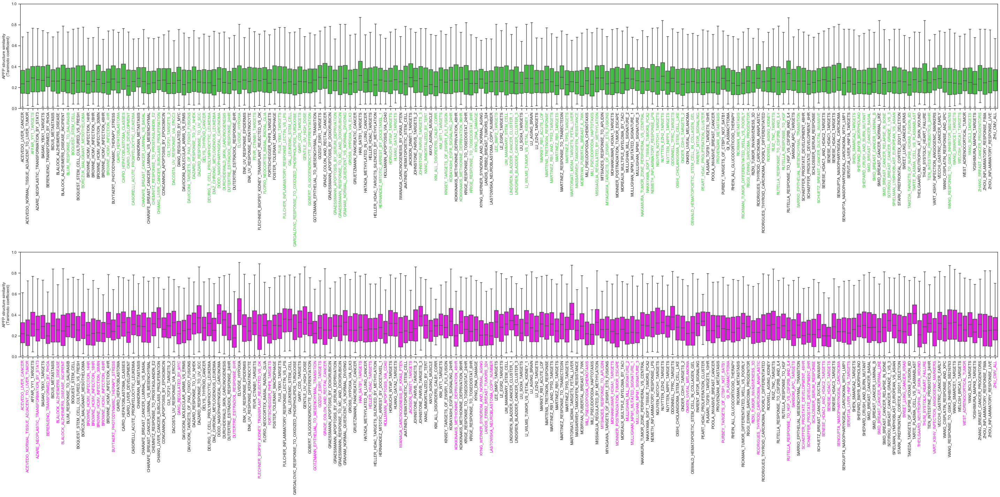

In [60]:
model = 'PACOS_tool_combined'
QUIZC_top50_tanimoto_dict = get_topN_tanimoto(proj_benchmark_path, benchmark_genesets, 
                                              apfp_Tanimoto_QUIZC_pert_iname, method_name='QUIZ-C', model=model, topN=50)

L1000CDS2_top50_tanimoto_dict = get_topN_tanimoto(proj_intermediary_outputs_path, benchmark_genesets, 
                                                  apfp_Tanimoto_L1000CDS2_pert_iname, method_name='L1000CDS2', model=model, topN=50)


QUIZC_top50_tanimoto_dict_labels, QUIZC_top50_tanimoto_dict_data = [*zip(*QUIZC_top50_tanimoto_dict.items())]
L1000CDS2_top50_tanimoto_dict_labels, L1000CDS2_top50_tanimoto_dict_data = [*zip(*L1000CDS2_top50_tanimoto_dict.items())]

colors1 = []
ctr = 0
for x_QUIZC, x_L1000CDS2 in zip(QUIZC_top50_tanimoto_dict_data,  L1000CDS2_top50_tanimoto_dict_data):
    if ((np.mean(x_QUIZC) - np.mean(x_L1000CDS2) < 0) & (st.mannwhitneyu(x_QUIZC, x_L1000CDS2)[1] <= 0.05)):
        colors1.append('limegreen')
        ctr += 1
    else:
        colors1.append('k')
print(ctr)

colors2 = []
ctr = 0
for x_QUIZC, x_L1000CDS2 in zip(QUIZC_top50_tanimoto_dict_data,  L1000CDS2_top50_tanimoto_dict_data):
    if ((np.mean(x_QUIZC) - np.mean(x_L1000CDS2) > 0) & (st.mannwhitneyu(x_QUIZC, x_L1000CDS2)[1] <= 0.05)):
        colors2.append('magenta')
        ctr += 1
    else:
        colors2.append('k')
print(ctr)

fig = plt.figure()
fig.set_size_inches(40, 20)
sns.set(font_scale=1.0)
with sns.axes_style("ticks"):
    ax1 = plt.subplot(211)
    sns.boxplot(data=QUIZC_top50_tanimoto_dict_data, color='limegreen', showfliers = False)
    for color, tick in zip(colors1, ax1.xaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.ylim(0.0, 1.0)
    plt.xticks(rotation=90)
    plt.xticks(range(0, len(QUIZC_top50_tanimoto_dict_labels)), QUIZC_top50_tanimoto_dict_labels)
    plt.ylabel('APFP structure similarity\n(Tanimoto coefficient)')
    
    ax2 = plt.subplot(212)
    sns.boxplot(data=L1000CDS2_top50_tanimoto_dict_data, color='magenta', showfliers = False)
    for color, tick in zip(colors2, ax2.xaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.ylim(0.0, 1.0)
    plt.xticks(rotation=90)
    plt.xticks(range(0, len(L1000CDS2_top50_tanimoto_dict_labels)), L1000CDS2_top50_tanimoto_dict_labels)
    plt.ylabel('APFP structure similarity\n(Tanimoto coefficient)')
    
    plt.tight_layout()
    plt.savefig(proj_output_path + 'QUIZC-L1000CDS2_Top50_Tanimoto_%s.pdf' % model, format='pdf')

In [160]:
QUIZC_top50_alldrugs = get_topN_drugs(proj_benchmark_path, benchmark_genesets, method_name='QUIZ-C', model='PACOS_tool_combined', topN=50)
L1000CDS2_top50_alldrugs = get_topN_drugs(proj_intermediary_outputs_path, benchmark_genesets, method_name='L1000CDS2', model='PACOS_tool_combined', 
                                          topN=50)
print(len(QUIZC_top50_alldrugs), len(L1000CDS2_top50_alldrugs))

100%|██████████| 194/194 [00:00<00:00, 16549.95it/s]

345 1157


### Supplementary Table 3

In [162]:
models = ['PACOS_Spearman_rho', 'PACOS_Spearman_rho_reverse', 'PACOS_tool_combined', 'PACOS_tool_combined_reverse']

chemical_diversity_stats = pd.DataFrame(index=['QUIZ-C vs MODZ/CD', 'QUIZ-C vs L1000CDS2', 'L1000CDS2 vs QUIZ-C'], columns=models)

for model in models:

    QUIZC_top50_tanimoto_dict = get_topN_tanimoto(proj_benchmark_path, benchmark_genesets, apfp_Tanimoto_QUIZC_pert_iname, method_name='QUIZ-C', 
                                                  model=model, topN=50)

    MODZ_top50_tanimoto_dict = get_topN_tanimoto(proj_benchmark_path, benchmark_genesets, apfp_Tanimoto_QUIZC_pert_iname, method_name='MODZ', 
                                                 model=model, topN=50)

    CD_top50_tanimoto_dict = get_topN_tanimoto(proj_benchmark_path, benchmark_genesets, apfp_Tanimoto_QUIZC_pert_iname, method_name='CD', 
                                               model=model, topN=50)
    
    L1000CDS2_top50_tanimoto_dict = get_topN_tanimoto(proj_intermediary_outputs_path, benchmark_genesets, 
                                                  apfp_Tanimoto_L1000CDS2_pert_iname, method_name='L1000CDS2', model=model, topN=50)

    QUIZC_top50_tanimoto_dict_labels, QUIZC_top50_tanimoto_dict_data = [*zip(*QUIZC_top50_tanimoto_dict.items())]
    MODZ_top50_tanimoto_dict_labels, MODZ_top50_tanimoto_dict_data = [*zip(*MODZ_top50_tanimoto_dict.items())]
    CD_top50_tanimoto_dict_labels, CD_top50_tanimoto_dict_data = [*zip(*CD_top50_tanimoto_dict.items())]

    colors = []
    for x_QUIZC, x_MODZ, x_CD in zip(QUIZC_top50_tanimoto_dict_data, MODZ_top50_tanimoto_dict_data, CD_top50_tanimoto_dict_data):
        if (((np.mean(x_QUIZC) - np.mean(x_CD) < 0) & (st.mannwhitneyu(x_QUIZC, x_CD)[1] <= 0.05)) & 
            ((np.mean(x_QUIZC) - np.mean(x_MODZ) < 0) & (st.mannwhitneyu(x_QUIZC, x_MODZ)[1] <= 0.05))):
            colors.append('limegreen')
        elif ((np.mean(x_QUIZC) - np.mean(x_CD) < 0) & (st.mannwhitneyu(x_QUIZC, x_CD)[1] <= 0.05)):
            colors.append('dodgerblue')
        elif ((np.mean(x_QUIZC) - np.mean(x_MODZ) < 0) & (st.mannwhitneyu(x_QUIZC, x_MODZ)[1] <= 0.05)):
            colors.append('tomato')
        else:
            colors.append('k')
    
    chemical_diversity_stats.at['QUIZ-C vs MODZ/CD', model] = sum([(c=='limegreen') | (c=='dodgerblue') | (c=='tomato')  for c in colors])
    
    
    QUIZC_top50_tanimoto_dict_labels, QUIZC_top50_tanimoto_dict_data = [*zip(*QUIZC_top50_tanimoto_dict.items())]
    L1000CDS2_top50_tanimoto_dict_labels, L1000CDS2_top50_tanimoto_dict_data = [*zip(*L1000CDS2_top50_tanimoto_dict.items())]

    colors1 = []
    ctr1 = 0
    for x_QUIZC, x_L1000CDS2 in zip(QUIZC_top50_tanimoto_dict_data,  L1000CDS2_top50_tanimoto_dict_data):
        if ((np.mean(x_QUIZC) - np.mean(x_L1000CDS2) < 0) & (st.mannwhitneyu(x_QUIZC, x_L1000CDS2)[1] <= 0.05)):
            colors1.append('limegreen')
            ctr1 += 1
        else:
            colors1.append('k')    
    chemical_diversity_stats.at['QUIZ-C vs L1000CDS2', model] = ctr1

    colors2 = []
    ctr2 = 0
    for x_QUIZC, x_L1000CDS2 in zip(QUIZC_top50_tanimoto_dict_data,  L1000CDS2_top50_tanimoto_dict_data):
        if ((np.mean(x_QUIZC) - np.mean(x_L1000CDS2) > 0) & (st.mannwhitneyu(x_QUIZC, x_L1000CDS2)[1] <= 0.05)):
            colors2.append('magenta')
            ctr2 += 1
        else:
            colors2.append('k')
    chemical_diversity_stats.at['L1000CDS2 vs QUIZ-C', model] = ctr2
    
chemical_diversity_stats.to_csv(proj_output_path + 'chemical_diversity_stats.csv')

100%|██████████| 194/194 [00:14<00:00, 13.30it/s]


### Supplementary Table 4

In [168]:
models = ['PACOS_Spearman_rho', 'PACOS_Spearman_rho_reverse', 'PACOS_tool_combined', 'PACOS_tool_combined_reverse']
methods = ['QUIZ-C', 'MODZ', 'CD', 'L1000CDS2']

drug_diversity_stats = pd.DataFrame(index=methods, columns=models)

for model in models:
    
    for method_name in methods:
    
        if method_name in ['QUIZ-C', 'MODZ', 'CD']:
            drug_diversity_stats.at[method_name, model] = len(get_topN_drugs(proj_benchmark_path, benchmark_genesets, method_name=method_name, 
                                                                         model=model, topN=50))
        elif method_name in ['L1000CDS2']:
            drug_diversity_stats.at[method_name, model] = len(get_topN_drugs(proj_intermediary_outputs_path, benchmark_genesets, 
                                                                             method_name=method_name, model=model, topN=50)) 
            
drug_diversity_stats.to_csv(proj_output_path + 'drug_diversity_stats.csv')

100%|██████████| 194/194 [00:00<00:00, 15876.67it/s]
